<a href="https://colab.research.google.com/github/ReemAbdelhaleemHassan/Image-Segmentation/blob/main/Image_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Reading from Google Drive**

In [ ]:
# Code to read file into Colaboratory:
! pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

## **Upload the dataset**

In [ ]:
link = 'https://drive.google.com/file/d/1gDh0lyglElhgxjXLkEJALhVsEYXSZ1Kw/view?usp=sharing' # The shareable link
# to get the id part of the file
id = link.split("/")[-2]
downloaded = drive.CreateFile({'id':id})
downloaded.GetContentFile('BSR_bsds500.tgz')

## **Unzipping**

In [ ]:
import tarfile
!tar -xvf  'BSR_bsds500.tgz' -C '/content/'

## **Imports**

In [ ]:
from scipy import io
import scipy
import os
from PIL import Image as im
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import math
import random
from sklearn.metrics.pairwise import euclidean_distances
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import data, color
from skimage.transform import resize
from sklearn.neighbors import NearestNeighbors
from prettytable import PrettyTable
from sklearn.metrics.cluster import contingency_matrix

## **Read the data**

In [ ]:
root = '/content/BSR/BSDS500/data/'
gt_PATH = os.path.join(root,'groundTruth/')
data_PATH = os.path.join(root,'images/')
ground_truth = []
dataset = []

# read only test data we can change this later 
for sub_dir_name in ['test']:
    sub_pth = os.path.join(gt_PATH,sub_dir_name)
    for filename in os.listdir(sub_pth):
        mat_file = io.loadmat(os.path.join(sub_pth,filename))
        ground_truth.append(mat_file['groundTruth'])
        
        # not the best way but to perserve the index order !!
        img_file = mpimg.imread(os.path.join(os.path.join(data_PATH,sub_dir_name),filename.split('.')[0]+".jpg"))
        dataset.append(img_file)


## **Function to generate all the available ground truth for an image**

In [ ]:
def get_GT(index):
  n = len(ground_truth[index][0])
  results = []

  for i in range(n):
    results.append(ground_truth[index][0][i][0][0][0])
  return results


## **Visualize the available ground truth of an image**

In [ ]:
def show_GT(index):
  gt = get_GT(index)

  fig = plt.figure(figsize=(25, 15))
  rows = 1
  columns = len(gt)
  for i in range(len(gt)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(gt[i])
    plt.title("Ground Truth "+ str(i+1))

In [ ]:
def view_image_only(n):
  fig1=plt.figure()
  plt.imshow(dataset[n])

## **K-Means Implementation**

In [ ]:
def Kmeans(dataset,k):
  #define constants in this function which determine its accuracy
  max_iterations=20
  tolerance=0.0001
  max_repetition=3

  #reshaping image to 1D instead of 2D
  dataset2=np.array(dataset)
  dataset2=dataset2.reshape(dataset2.shape[0]*dataset2.shape[1],dataset2.shape[2])
  
  flag=1 #flag to make sure all clusters are not empty
  iterate=0 #keep track how many times we repeat the reclustering to set a limit
  empty=[] #array to keep track of empty clusters

  while(flag==1):
    iterate+=1
    #initialize variables
    centroids=[]
    flag=0
    #choosing a random centroids from the dataset
    for i in range(k):
      if np.unique(dataset2, axis=0).shape[0]>=k: #if there is more than (k) colors, let's pick different k centroids
        ready=0
        while ready==0:
          ready=1
          c=random.choice(dataset2)
          for centroid in centroids:
            for e in range(dataset2.shape[-1]):
              if c[e]==centroid[e]:
                ready+=1
            if ready==c.shape[0]+1:
              ready=0
        else: #if the image doesn't contain k unique colors, we will ignore the condition of different centroids
          c=random.choice(dataset2)
      centroids.append(c)
    #starting the clustering algorithm
    for i in range(max_iterations):
      #preparing the clusters array
      clusters=[]
      for j in range(k):
        clusters.append([])
      #cluster assignment (adding the index of the pixel not the pixel itself in the cluster)
      for d in range(dataset2.shape[0]):
        min=math.inf
        for m in range(k):
          distance=np.linalg.norm(centroids[m]-dataset2[d])
          if(distance<min):
            min=distance
            j=m
        clusters[j].append(d)
      #check if any clusters is empty
      for m in range(k):
        if len(clusters[m])==0:
          empty.append(m)
          flag=1
      #if a cluster is empty choose another random k points and repeat the clustering
      if flag==1 and iterate<=max_repetition:
        flag=0
        break
      #if the reclustering is executed more than 10 times, assign a random centroid for the empty clusters only
      if flag==1 and iterate>max_repetition:
        flag=0
        for e in empty:
          np.append(centroids[e],random.choice(dataset2))
        empty=[] #reset empty array
      #centroids update
      centroids_copy=np.array(centroids)
      for m in range(k):
        ind=np.array(clusters[m])
        centroids[m]=dataset2[ind].mean(axis=0)
      #tolerance check
      sum=0.0
      for m in range(k):
        sum+=pow(np.linalg.norm(centroids[m]-centroids_copy[m]),2)
      if sum<tolerance:
        break
  for i in range(k):
    dataset2[clusters[i]]=[i]
  dataset2=dataset2[:,0].reshape((dataset.shape[0],dataset.shape[1]))
  return dataset2

In [ ]:
def color_clustered_image(image,k):
  image=np.array(image,dtype=np.int64)
  colors=[[255,255,0],[0,255,255],[255,0,255],[255,255,255],[0,0,0],[0,0,255],[0,255,0],[255,0,0],[50,0,50],[50,255,0],[0,50,0]]
  for row in image:
    for pixel in row:
      pixel=colors[pixel.round()]
  return image

In [ ]:
def apply_kmeans(n,k):
  image=dataset[n]
  clustered_image=Kmeans(image,k)
  colored_clustered_image=color_clustered_image(clustered_image,k)
  return colored_clustered_image

In [ ]:
def show_img(img):
  fig=plt.figure()
  plt.imshow(img)

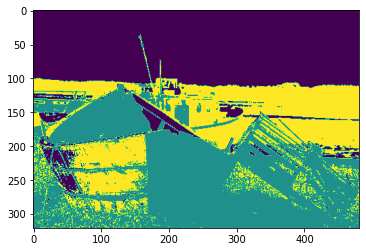

In [ ]:
n=5
k=3
img=apply_kmeans(n,k)
show_img(img)

## **Visualization of clusters Function**

In [ ]:
def show_clusters(clusters,original_img_index):

  fig = plt.figure(figsize=(25, 15))
  rows = 1
  columns = 5

  fig.add_subplot(rows, columns, 1)
  plt.imshow(clusters[0])
  plt.title("K=3")

  fig.add_subplot(rows, columns, 2)
  plt.imshow(clusters[1])
  plt.title("K=5")

  fig.add_subplot(rows, columns, 3)
  plt.imshow(clusters[2])
  plt.title("K=7")

  fig.add_subplot(rows, columns, 4)
  plt.imshow(clusters[3])
  plt.title("K=9")

  fig.add_subplot(rows, columns, 5)
  plt.imshow(color_clustered_image(clusters[4],11))
  plt.title("K=11")

## **Perform Kmeans clustering on 50 test samples**

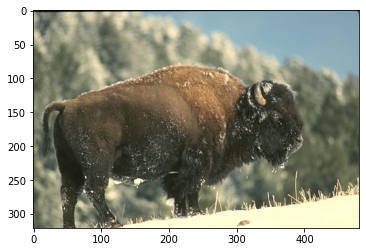

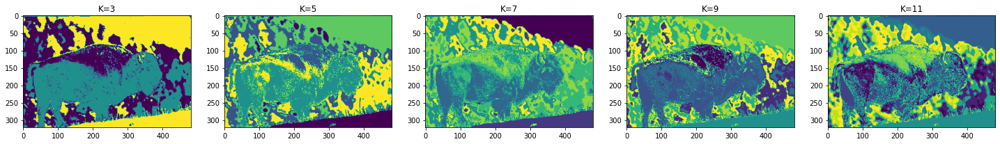

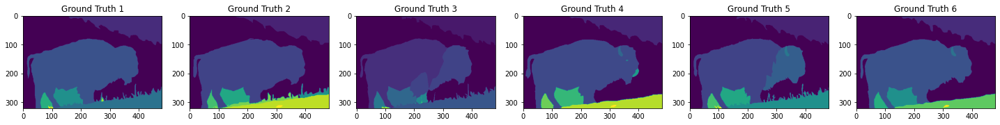

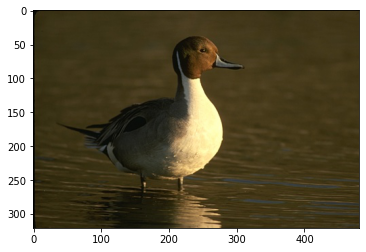

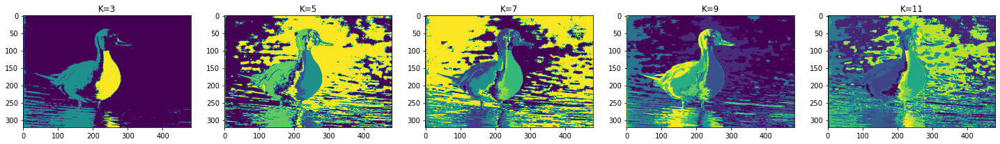

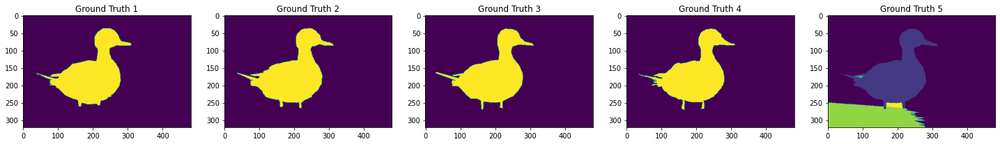

In [ ]:
k = [3,5,7,9,11]
clusters = []

# replace 2 with 50 for the all test samples !!
for sample in range(2):

  ci = []
  view_image_only(sample)
  for ki in k:
    ci.append(Kmeans(dataset[sample],ki))

  # Segmentations and GroundTruth Visualization
  show_clusters(ci,sample)
  show_GT(sample)
  clusters.append(ci)


## **K-NN Similarity Function**

In [ ]:
def nn_similarity(n,dataset):
  data=np.array(dataset)
  data=data.reshape(data.shape[0]*data.shape[1],data.shape[2])
  dist_matrix=euclidean_distances(data,data)
  A=np.zeros(dist_matrix.shape)
  for i in range(dist_matrix.shape[0]):
    ind=dist_matrix[i,:].argsort()
    temp=dist_matrix[i,ind]
    y=temp[n]
    vectorizer = np.vectorize(lambda x: 1 if x <= y and x!=0 else 0)
    A[i]=np.vectorize(vectorizer)(dist_matrix[i])
  return A

## **Resizing Function**

In [ ]:
def resize_img(img):
  return resize(img, (img.shape[0] // 4, img.shape[1] // 4,3),anti_aliasing=True)

## **Normalization Function**

In [ ]:
def normalization(vec):
  results = []
  for i in range(vec.shape[0]):
    norm=np.linalg.norm(vec[i])
    results.append(vec[i]/norm)
  return np.array(results)

## **Normalized Cut function**

In [ ]:
def normalized_cut(nn_neigbors,k,img):
  #reshape img to 1D instead of 2D
  img2=img.reshape(img.shape[0]*img.shape[1],img.shape[2])

  # build K-NN graph for the samples
  nbrs = NearestNeighbors(n_neighbors=(nn_neigbors+1), algorithm='auto').fit(img2)
  A = nbrs.kneighbors_graph(img2).toarray()

  # reject the self neighbour for the point -> zeroing the diagonal
  np.fill_diagonal(A,0)

  # build degree matrix --> nn_neigbors*I
  delta = np.identity(A.shape[0]) * nn_neigbors

  # Laplacian Matrix
  A = delta - A

  # compute the eigen_values and eigen vectors and pick the k vectors corresponding to the smallest k eigen values
  eigen_val, eigen_vec = np.linalg.eig(np.dot(np.linalg.inv(delta),A))
  idx = np.real(eigen_val).argsort()[1:k+1]
  eigen_vec = np.real(eigen_vec[:,idx])

  # normalization 
  normalized_eigen_vec = normalization(eigen_vec)

  #return new coordinates
  img2=normalized_eigen_vec.reshape(img.shape[0],img.shape[1],k)
  return img2

## **Applying Spectral Analysis**

In [ ]:
def apply_spectral(k,n):
  resized_image=resize_img(dataset[n])
  image=resized_image.reshape(resized_image.shape[0]*resized_image.shape[1],resized_image.shape[2])
  from sklearn.cluster import SpectralClustering
  clustering = SpectralClustering(n_clusters=k,assign_labels='kmeans',
                                  affinity='nearest_neighbors'
                                  ,n_neighbors=5).fit(image)
  labels=clustering.labels_
  labels=labels.reshape(resized_image.shape[0],resized_image.shape[1])
  img_colored=color_clustered_image(labels,k)
  return img_colored

In [ ]:
def apply_our_spectral(k,n):
  img=normalized_cut(5,k,resize_img(dataset[n]))
  img=Kmeans(img,k)
  img=color_clustered_image(img,k)
  return img

## **K=3**

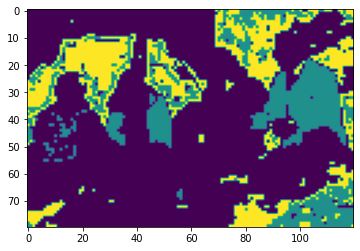

In [ ]:
n=21
k=3
img=apply_our_spectral(k,n)
show_img(img)

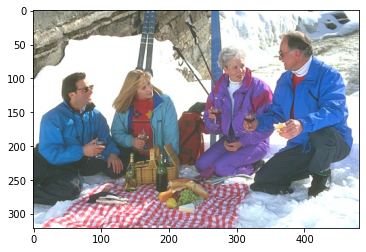

In [ ]:
view_image_only(21)

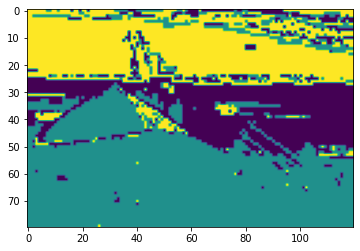

In [ ]:
n=5
k=3
img=apply_our_spectral(k,n)
show_img(img)

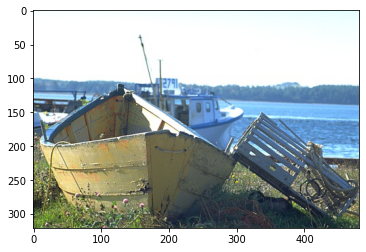

In [ ]:
view_image_only(5)

## **K=5**

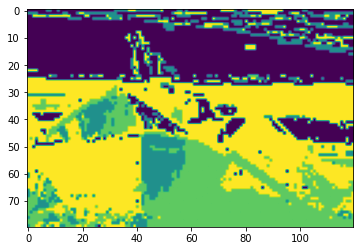

In [ ]:
n=5
k=5
img=apply_our_spectral(k,n)
show_img(img)

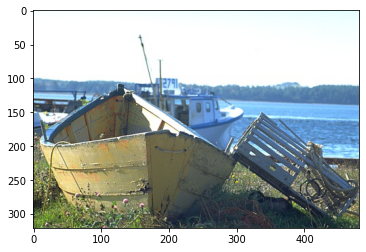

In [ ]:
view_image_only(5)

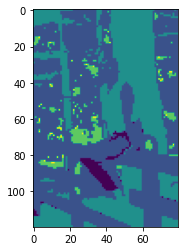

In [ ]:
n=1
k=5
img=apply_our_spectral(k,n)
show_img(img)

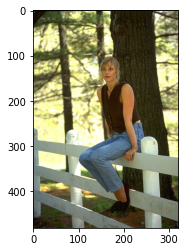

In [ ]:
view_image_only(1)

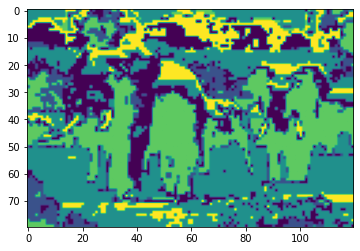

In [ ]:
n=35
k=5
img=apply_our_spectral(k,n)
show_img(img)

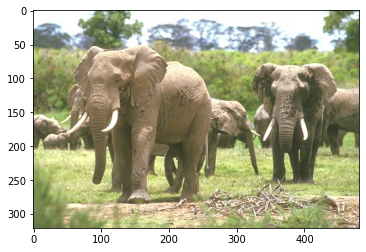

In [ ]:
view_image_only(35)

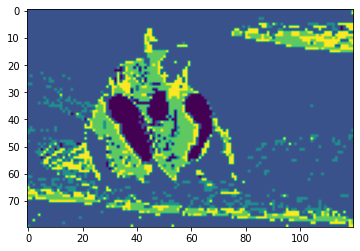

In [ ]:
n=9
k=5
img=apply_our_spectral(k,n)
show_img(img)

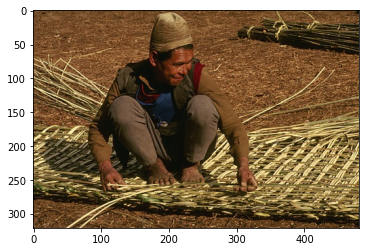

In [ ]:
view_image_only(9)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


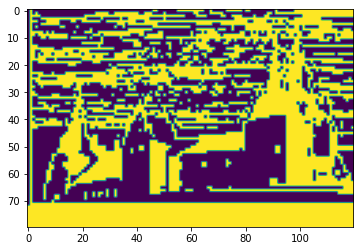

In [ ]:
n=10
k=5
img=apply_our_spectral(k,n)
show_img(img)

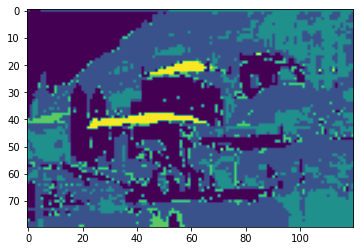

In [ ]:
n=40
k=5
img=apply_our_spectral(k,n)
show_img(img)

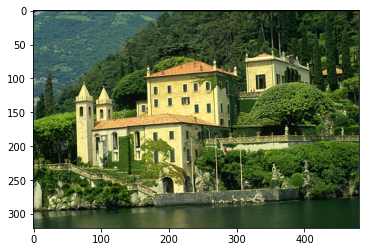

In [ ]:
view_image_only(40)

## **F-measure and Conditional Entropy Evaulations**

In [ ]:
def equal_clusters(x,gt):
  l1 , c1 = np.unique(gt,return_counts=True)
  l2 , c2 = np.unique(x,return_counts=True)
  if len(l1) > len(l2):
    np.place(gt,gt>len(l2),len(l2))
  elif len(l1) < len(l2):
    np.place(x,x>len(l1),len(l1))
  return x,gt

## **Evaulations**

In [ ]:
def evaluation(cluster, groundtruth):

  clustering_labels = cluster
  groud_truth_labels = groundtruth.flatten()

  # K x 3 Matrix for every cluster counting the the TP 
  contingency_mat = contingency_matrix (groud_truth_labels, clustering_labels)
  ## rows->>> predicted. , cols->>> ground_truth
  contingency_mat = contingency_mat.T
  precision = np.zeros((contingency_mat.shape[0],1))
  recall = np.zeros((contingency_mat.shape[0],1))
  ##rows represent predicted clusters with kmeans
  ## coloumns represents ground truth classes
  ## preision Tp"of max no."" / segma(col)
  ## precision  Tp "of max no."" / segma(row)
  for i in range(contingency_mat.shape[0]):
    index_max = np.argmax(contingency_mat[i])
    precision[i] = contingency_mat[i][index_max]/np.sum(contingency_mat[i])
    recall[i] = contingency_mat[i][index_max]/np.sum(contingency_mat[:,index_max])
  F_score = (2*precision*recall) / (precision + recall)
  F_score_total = np.mean(F_score)

  
  count_per_cluster = np.sum(contingency_mat,axis =1)#total number of pixels per cluster
  count_total = np.sum(count_per_cluster)
  cont_entropy = np.where(np.copy(contingency_mat) == 0, 1, np.copy(contingency_mat))
  entropy_mat = np.zeros((cont_entropy.shape[0],1))
  for i in range(cont_entropy.shape[0]):
    entropy_mat[i] = count_per_cluster[i]*np.sum(-contingency_mat[i]*np.log10(cont_entropy[i]/np.sum(contingency_mat[i])))/np.sum(contingency_mat[i])
  entropy = np.sum(entropy_mat)/count_total
  return round(F_score_total,6),round(entropy,6)

In [ ]:
def show_evaluation(clusters,gt):

  f_measures_means = []
  entropy_means = []
  for i in range(len(clusters)):
    f_measures_sum = 0
    entropy_sum = 0
    for j in range(len(gt)):
      clusters[i],gt[j] = equal_clusters(clusters[i],gt[j])
      f_measures_sum += evaluation(clusters[i],gt[j])[0]
      entropy_sum += evaluation(clusters[i],gt[j])[1]
    f_measures_means.append(f_measures_sum/len(gt))
    entropy_means.append(f_measures_sum/len(gt))
  
  table = PrettyTable()
  table.add_column("K",[3,5,7,9,11])
  table.add_column("F_measures mean",f_measures_means)
  table.add_column("Conditional Entropy mean",entropy_means)
  print(table)

In [ ]:
def test_kmeans(start,end):
  k = [3,5,7,9,11]
  clusters = []

  for sample in range(start,end+1,1):

    ci = []
    view_image_only(sample)
    for ki in k:
      ci.append(Kmeans(dataset[sample],ki))

    # Segmentations and GroundTruth Visualization
    show_clusters(ci,sample)
    show_GT(sample)
    show_evaluation(ci,get_GT(sample))
    clusters.append(ci)

+----+---------------------+--------------------------+
| K  |   F_measures mean   | Conditional Entropy mean |
+----+---------------------+--------------------------+
| 3  | 0.45735416666666673 |   0.45735416666666673    |
| 5  |       0.392191      |         0.392191         |
| 7  | 0.43614966666666666 |   0.43614966666666666    |
| 9  |  0.4185398333333334 |    0.4185398333333334    |
| 11 | 0.37820066666666663 |   0.37820066666666663    |
+----+---------------------+--------------------------+


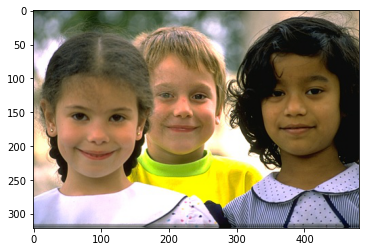

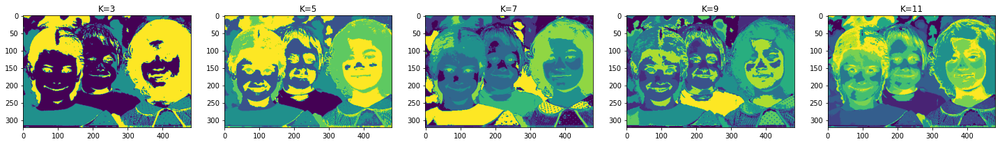

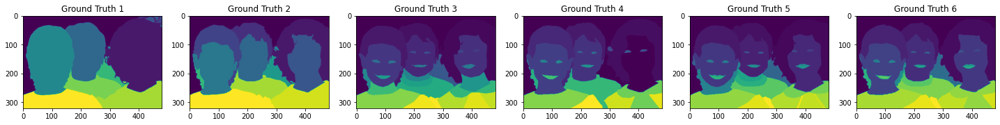

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
clusters.append(ci)

+----+---------------------+--------------------------+
| K  |   F_measures mean   | Conditional Entropy mean |
+----+---------------------+--------------------------+
| 3  |  0.5411322000000001 |    0.5411322000000001    |
| 5  |      0.4729312      |        0.4729312         |
| 7  | 0.46258720000000003 |   0.46258720000000003    |
| 9  |      0.5085508      |        0.5085508         |
| 11 |      0.4287736      |        0.4287736         |
+----+---------------------+--------------------------+


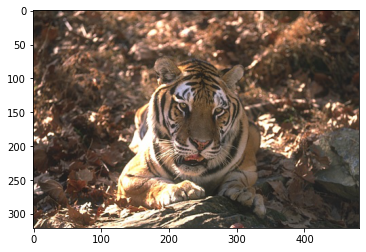

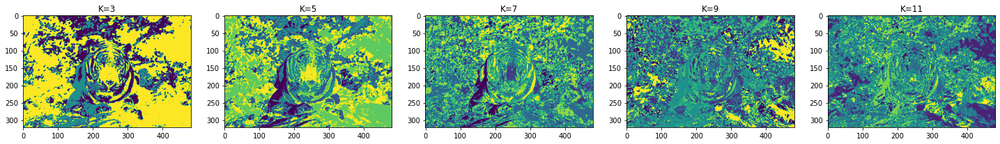

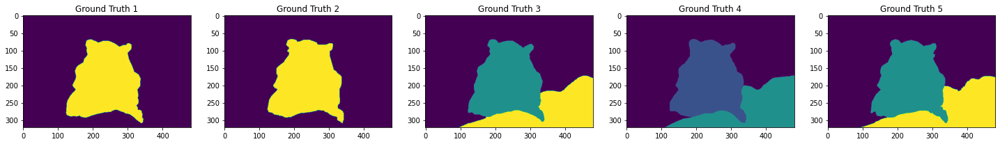

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
clusters.append(ci)

+----+--------------------+--------------------------+
| K  |  F_measures mean   | Conditional Entropy mean |
+----+--------------------+--------------------------+
| 3  | 0.7693190000000001 |    0.7693190000000001    |
| 5  |     0.6621832      |        0.6621832         |
| 7  |     0.4696592      |        0.4696592         |
| 9  |     0.6318216      |        0.6318216         |
| 11 | 0.5560657999999999 |    0.5560657999999999    |
+----+--------------------+--------------------------+


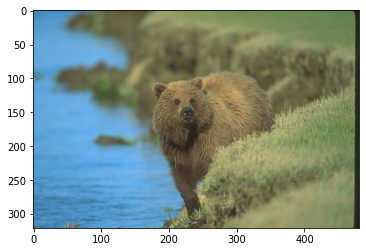

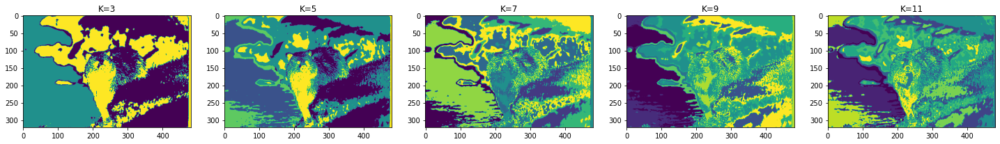

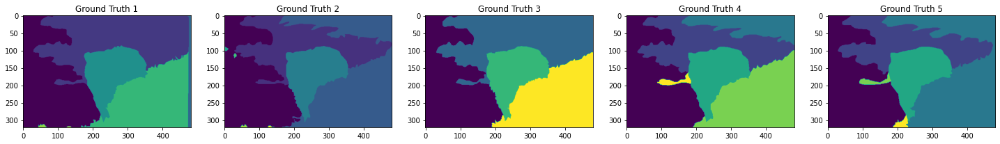

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
clusters.append(ci)

+----+---------------------+--------------------------+
| K  |   F_measures mean   | Conditional Entropy mean |
+----+---------------------+--------------------------+
| 3  |  0.6192296666666666 |   0.31837150000000003    |
| 5  | 0.44299483333333334 |    0.4206706666666667    |
| 7  |  0.4051076666666667 |    0.4222810000000001    |
| 9  |  0.3928688333333334 |        0.4412585         |
| 11 |  0.3072033333333334 |        0.4585515         |
+----+---------------------+--------------------------+


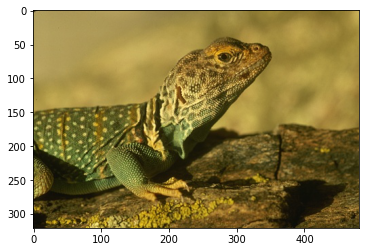

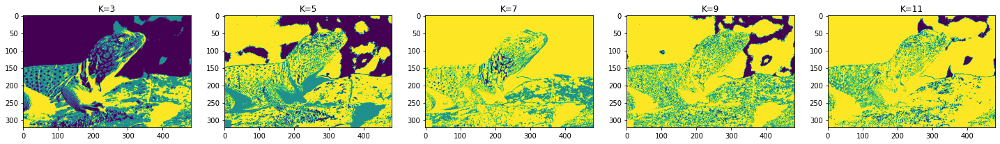

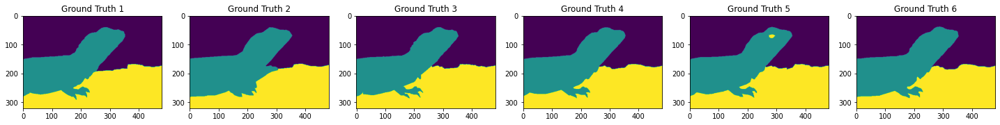

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
clusters.append(ci)

+----+---------------------+--------------------------+
| K  |   F_measures mean   | Conditional Entropy mean |
+----+---------------------+--------------------------+
| 3  |      0.6918658      |        0.1059342         |
| 5  |      0.7385424      |         0.060845         |
| 7  | 0.39375940000000004 |   0.23875100000000002    |
| 9  |      0.7138458      |        0.0595402         |
| 11 |      0.5548676      |   0.19130019999999998    |
+----+---------------------+--------------------------+


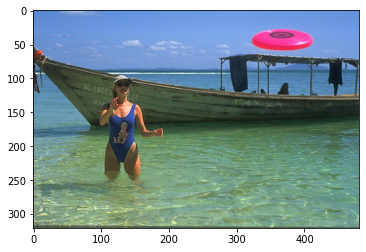

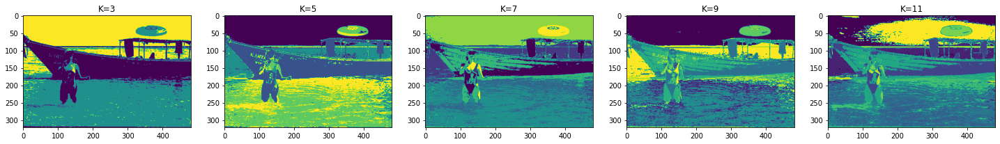

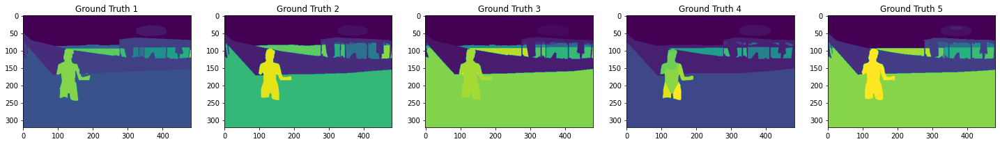

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
clusters.append(ci)

+----+-----------------+--------------------------+
| K  | F_measures mean | Conditional Entropy mean |
+----+-----------------+--------------------------+
| 3  |    0.4415808    |        0.2367282         |
| 5  |     0.409729    |   0.24577419999999997    |
| 7  |    0.4073722    |         0.25787          |
| 9  |    0.3768132    |   0.25629399999999997    |
| 11 |    0.3888932    |        0.2557522         |
+----+-----------------+--------------------------+


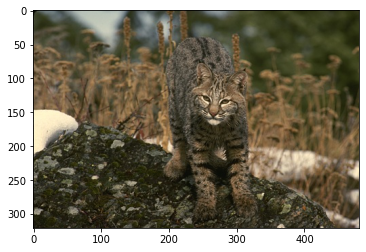

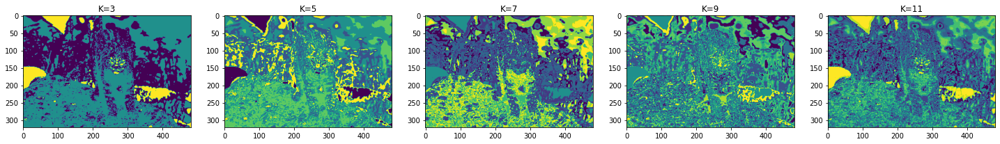

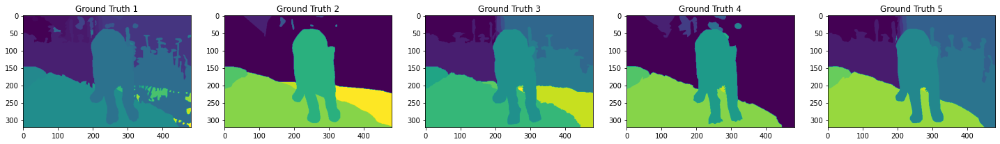

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
clusters.append(ci)

In [ ]:
k = [3,5,7,9,11]
ci = []
sample = 0
for ki in k:
  ci.append(Kmeans(dataset[sample],ki))


In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
# clusters.append(ci)


+----+---------------------+--------------------------+
| K  |   F_measures mean   | Conditional Entropy mean |
+----+---------------------+--------------------------+
| 3  |       0.63146       |   0.23281739999999998    |
| 5  | 0.48582380000000003 |   0.28848900000000005    |
| 7  | 0.42846600000000007 |         0.326974         |
| 9  | 0.42725359999999996 |        0.3221718         |
| 11 |      0.3625758      |         0.334625         |
+----+---------------------+--------------------------+


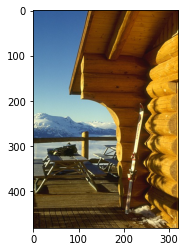

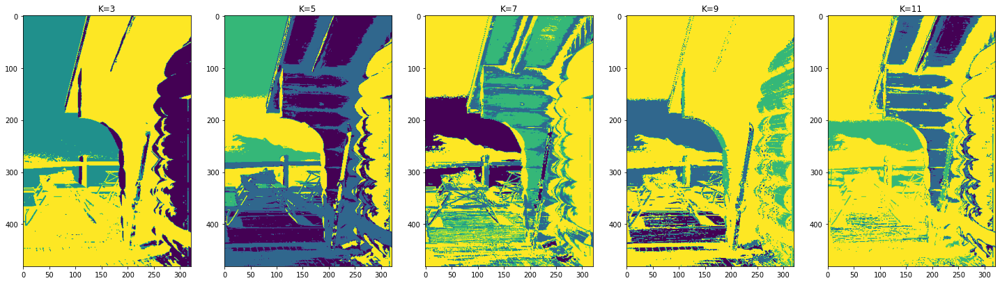

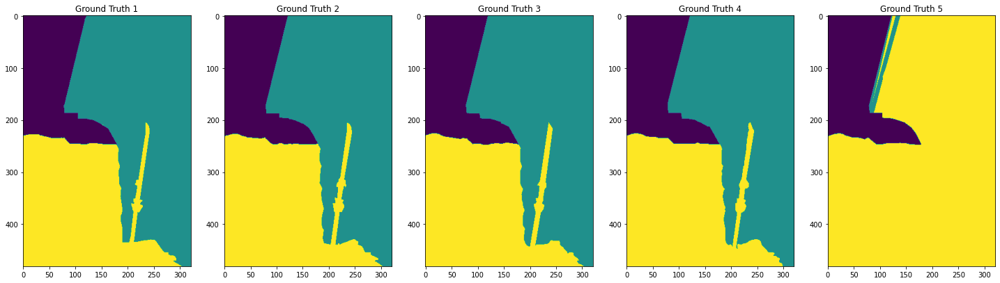

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
# clusters.append(ci)


+----+---------------------+--------------------------+
| K  |   F_measures mean   | Conditional Entropy mean |
+----+---------------------+--------------------------+
| 3  | 0.45781320000000003 |         0.211721         |
| 5  |       0.462317      |        0.2299562         |
| 7  | 0.44414479999999995 |        0.2251494         |
| 9  |  0.4243221999999999 |        0.2303622         |
| 11 |       0.408068      |   0.22928600000000002    |
+----+---------------------+--------------------------+


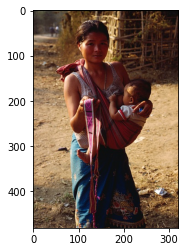

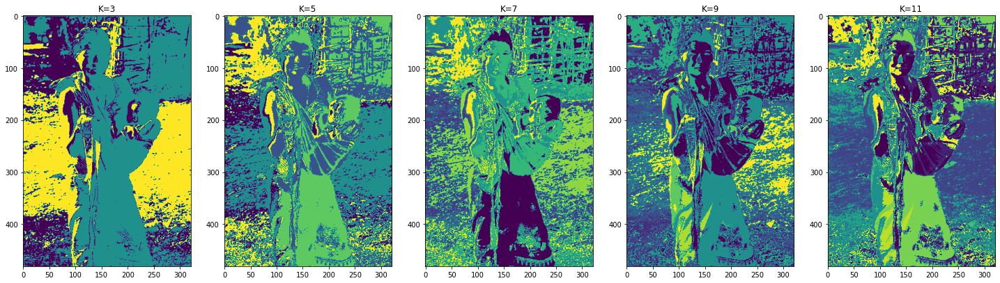

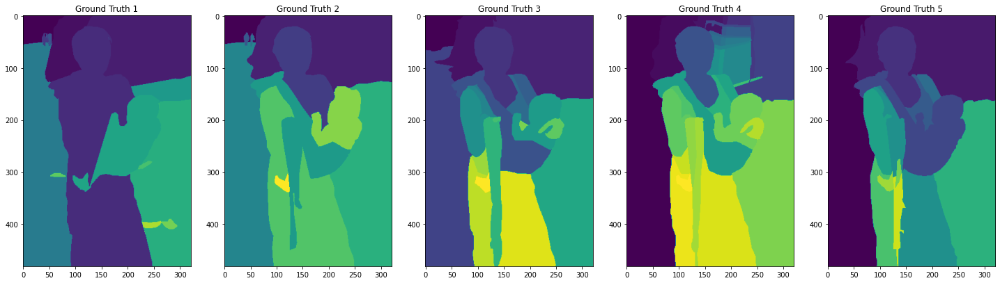

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
clusters.append(ci)

+----+---------------------+--------------------------+
| K  |   F_measures mean   | Conditional Entropy mean |
+----+---------------------+--------------------------+
| 3  |  0.7055020000000001 |   0.12795600000000001    |
| 5  |  0.5409271999999999 |   0.24355279999999996    |
| 7  |      0.7025838      |   0.13174999999999998    |
| 9  |       0.407718      |   0.27648160000000005    |
| 11 | 0.48608019999999996 |        0.2457282         |
+----+---------------------+--------------------------+


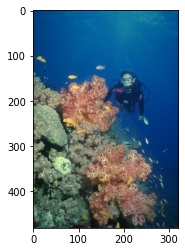

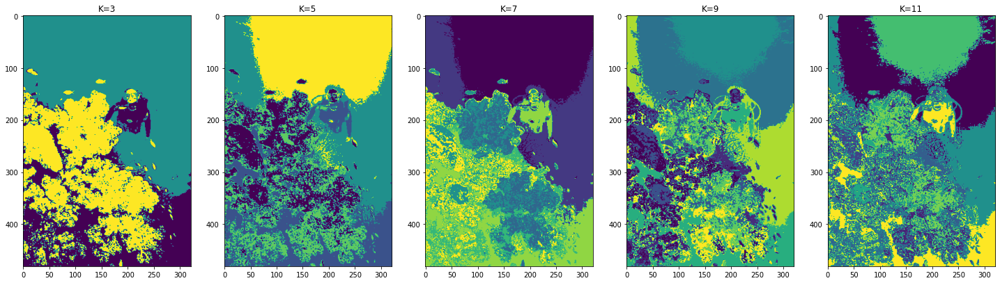

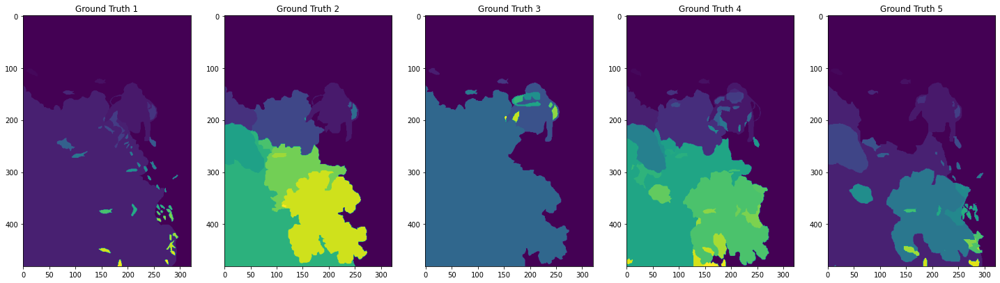

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
clusters.append(ci)

+----+---------------------+--------------------------+
| K  |   F_measures mean   | Conditional Entropy mean |
+----+---------------------+--------------------------+
| 3  |  0.5649398000000001 |        0.3217314         |
| 5  | 0.49695900000000004 |        0.3704858         |
| 7  |  0.6665528000000001 |        0.2353538         |
| 9  |      0.3375978      |        0.4279116         |
| 11 |  0.3516108000000001 |   0.42966679999999996    |
+----+---------------------+--------------------------+


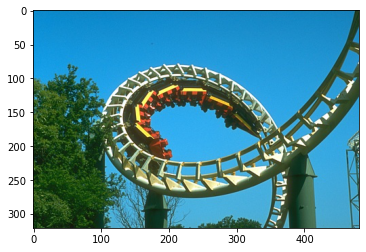

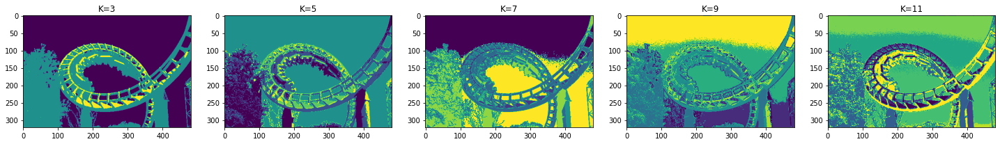

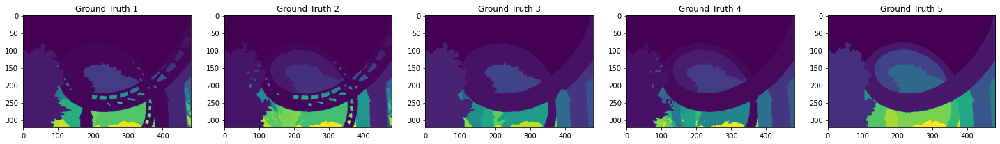

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
clusters.append(ci)

+----+---------------------+--------------------------+
| K  |   F_measures mean   | Conditional Entropy mean |
+----+---------------------+--------------------------+
| 3  |  0.5664117999999999 |   0.15298340000000002    |
| 5  |      0.5548056      |        0.1837028         |
| 7  | 0.42314919999999995 |        0.2085296         |
| 9  | 0.41646320000000003 |        0.2107992         |
| 11 |       0.336985      |   0.24639040000000004    |
+----+---------------------+--------------------------+


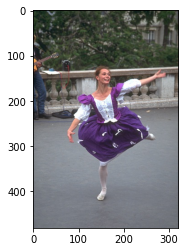

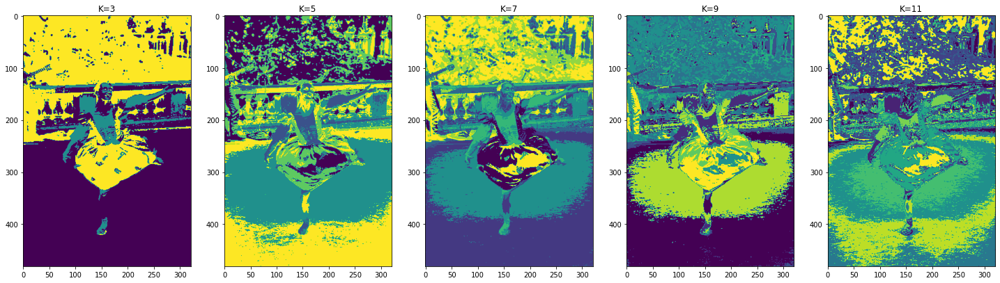

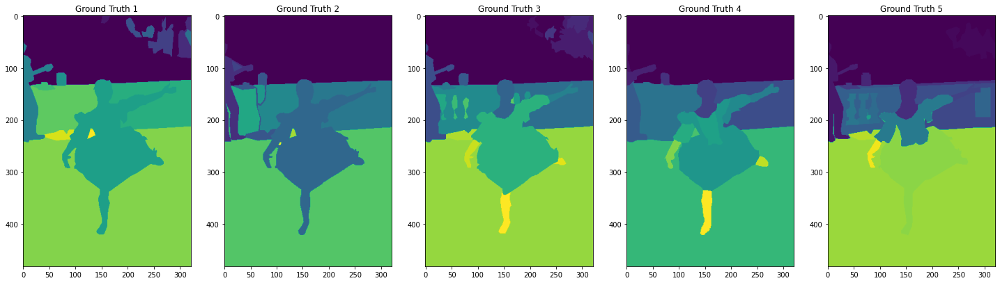

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
clusters.append(ci)

+----+---------------------+--------------------------+
| K  |   F_measures mean   | Conditional Entropy mean |
+----+---------------------+--------------------------+
| 3  |  0.5757976666666665 |   0.28501916666666666    |
| 5  |  0.4486578333333333 |   0.32492800000000005    |
| 7  |  0.4034678333333333 |    0.3446403333333334    |
| 9  |       0.353563      |   0.36223216666666663    |
| 11 | 0.34810333333333326 |   0.35845316666666666    |
+----+---------------------+--------------------------+


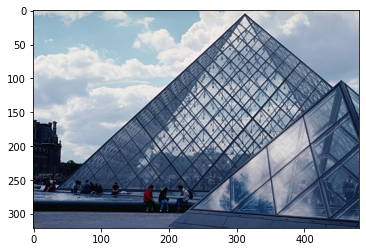

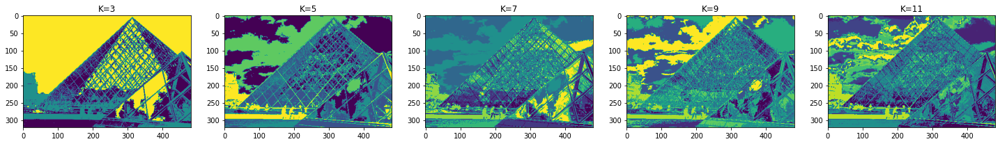

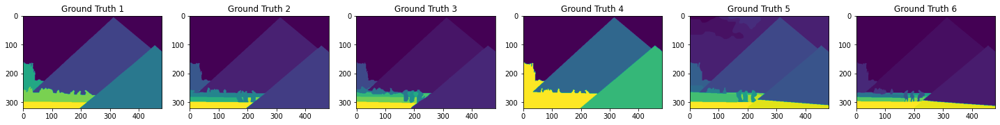

In [ ]:
# Segmentations and GroundTruth Visualization
view_image_only(sample)
show_clusters(ci,sample)
show_GT(sample)
show_evaluation(ci,get_GT(sample))
# clusters.append(ci)

## **BONUS**

### **Adding Coordinates**

In [ ]:
def add_x_y(data):
  x_max = data.shape[1]
  y_max = data.shape[0]
  coord = np.array([ [x,y] for x in range(x_max) for y in range(y_max)]).reshape((y_max,x_max,2))
  
  return np.concatenate((data,coord),axis=2)

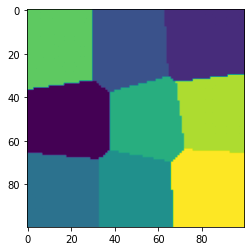

In [ ]:
coord = np.array([ [x,y] for x in range(100) for y in range(100)]).reshape((100,100,2))
n=30
k=9
clustered_image=Kmeans(coord,k)
clustered_image=color_clustered_image( clustered_image ,3)
fig=plt.figure()
plt.imshow(clustered_image)

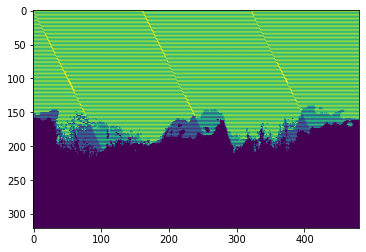

In [ ]:
n=30
k=3
image=add_x_y(dataset[n])
clustered_image=Kmeans(image,k)
clustered_image=color_clustered_image( clustered_image ,3)
fig=plt.figure()
plt.imshow(clustered_image)

## **Attribute Scaling**

In [ ]:
def scale_arr(image):
  arr=image.reshape(image.shape[0]*image.shape[1],image.shape[2])
  min=arr.min(axis=0)
  max=arr.max(axis=0)
  diff=max-min
  arr=(arr-min)/ diff
  arr=arr.reshape(image.shape)
  return arr

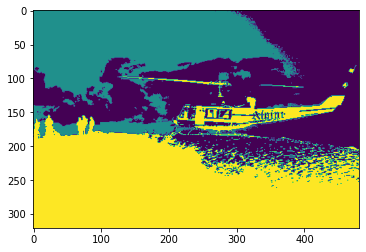

In [ ]:
n=30
k=3
image=add_x_y(dataset[n])
image=scale_arr(image)
clustered_image=Kmeans(image,k)
clustered_image=color_clustered_image( clustered_image ,k)
fig=plt.figure()
plt.imshow(clustered_image)

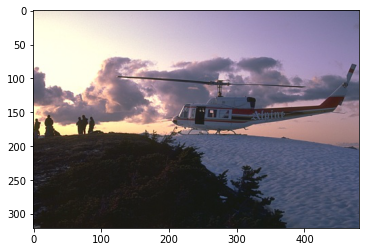

In [ ]:
view_image_only(n)

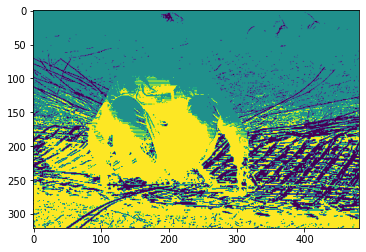

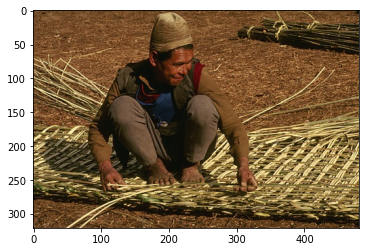

In [ ]:
n=9
k=3
image=add_x_y(dataset[n])
image=scale_arr(image)
clustered_image=Kmeans(image,k)
clustered_image=color_clustered_image( clustered_image ,k)
fig=plt.figure()
plt.imshow(clustered_image)
view_image_only(n)

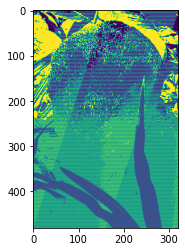

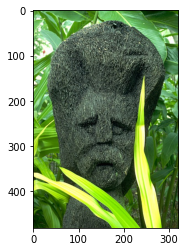

In [ ]:
n=6
k=5
image=add_x_y(dataset[n])
image=scale_arr(image)
clustered_image=Kmeans(image,k)
clustered_image=color_clustered_image( clustered_image ,k)
fig=plt.figure()
plt.imshow(clustered_image)
view_image_only(n)

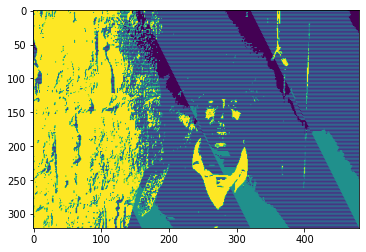

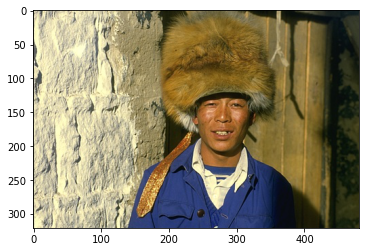

In [ ]:
n=7
k=3
image=add_x_y(dataset[n])
image=scale_arr(image)
clustered_image=Kmeans(image,k)
clustered_image=color_clustered_image( clustered_image ,k)
fig=plt.figure()
plt.imshow(clustered_image)
view_image_only(n)

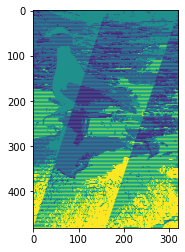

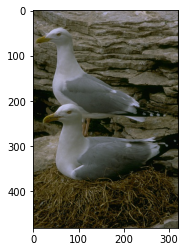

In [ ]:
n=18
k=3
image=add_x_y(dataset[n])
image=scale_arr(image)
clustered_image=Kmeans(image,k)
clustered_image=color_clustered_image( clustered_image ,k)
fig=plt.figure()
plt.imshow(clustered_image)
view_image_only(n)

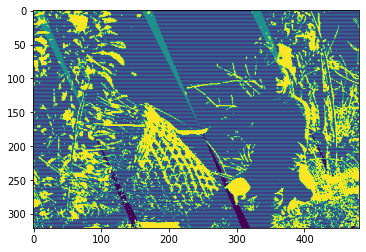

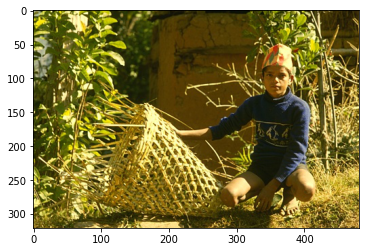

In [ ]:
n=49
k=3
image=add_x_y(dataset[n])
image=scale_arr(image)
clustered_image=Kmeans(image,k)
clustered_image=color_clustered_image( clustered_image ,k)
fig=plt.figure()
plt.imshow(clustered_image)
view_image_only(n)

## **Big Picture**

Text(0.5, 1.0, 'Spectral clustering')

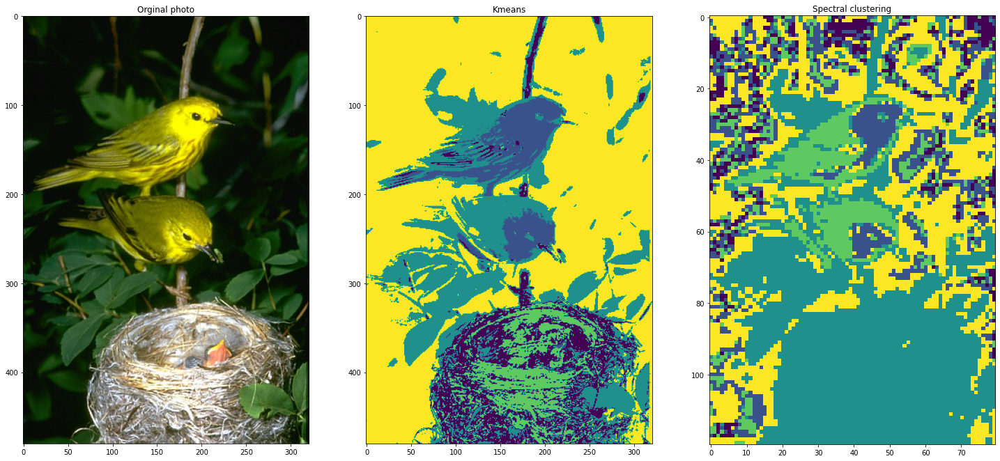

In [ ]:
n=11
k=5
img = apply_kmeans(n,k)
img2=apply_our_spectral(k,n)

fig = plt.figure(figsize=(25, 15))

fig.add_subplot(1, 3, 1)
plt.imshow(dataset[n])
plt.title("Orginal photo")
fig.add_subplot(1, 3, 2)
plt.imshow(img)
plt.title("Kmeans")
fig.add_subplot(1, 3, 3)
plt.imshow(img2)
plt.title("Spectral clustering")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


Text(0.5, 1.0, 'Spectral clustering')

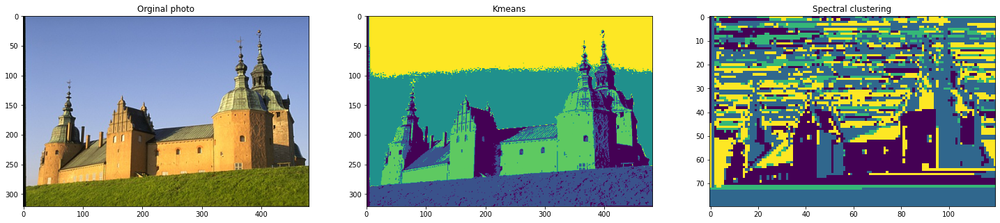

In [ ]:
n=10
k=5
img = apply_kmeans(n,k)
img2=apply_our_spectral(k,n)

fig = plt.figure(figsize=(25, 15))

fig.add_subplot(1, 3, 1)
plt.imshow(dataset[n])
plt.title("Orginal photo")
fig.add_subplot(1, 3, 2)
plt.imshow(img)
plt.title("Kmeans")
fig.add_subplot(1, 3, 3)
plt.imshow(img2)
plt.title("Spectral clustering")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in true_divide
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


Text(0.5, 1.0, 'Spectral clustering')

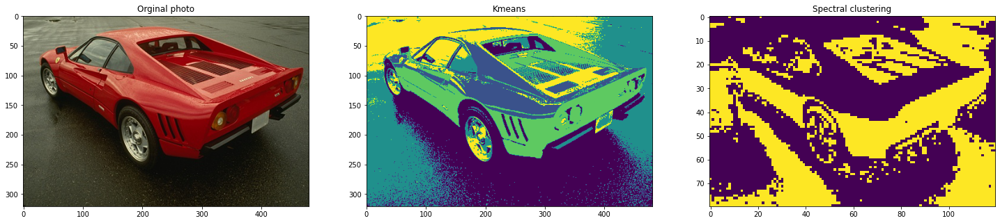

In [ ]:
n=136
k=5
# view_image_only(n)
img = apply_kmeans(n,k)
img2=apply_our_spectral(k,n)

fig = plt.figure(figsize=(25, 15))

fig.add_subplot(1, 3, 1)
plt.imshow(dataset[n])
plt.title("Orginal photo")
fig.add_subplot(1, 3, 2)
plt.imshow(img)
plt.title("Kmeans")
fig.add_subplot(1, 3, 3)
plt.imshow(img2)
plt.title("Spectral clustering")

Text(0.5, 1.0, 'Spectral clustering')

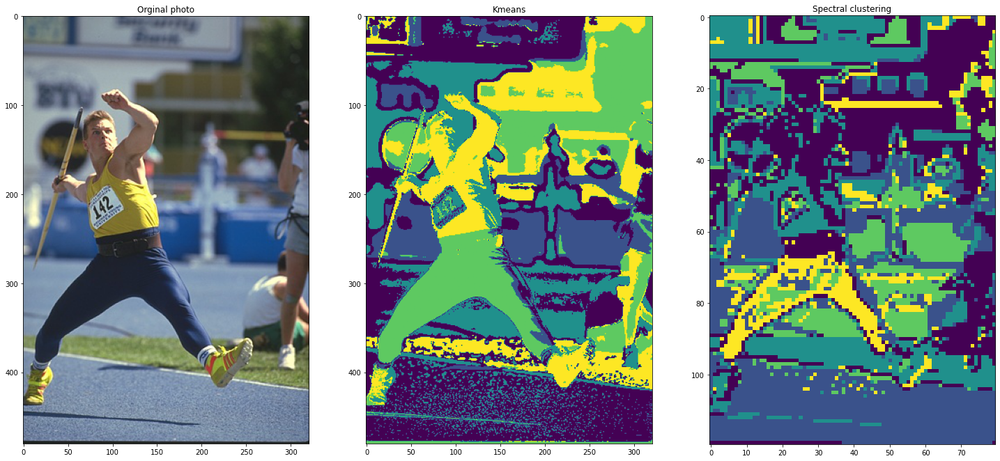

In [ ]:
n=136
k=5
# view_image_only(n)
img = apply_kmeans(n,k)
img2=apply_our_spectral(k,n)

fig = plt.figure(figsize=(25, 15))

fig.add_subplot(1, 3, 1)
plt.imshow(dataset[n])
plt.title("Orginal photo")
fig.add_subplot(1, 3, 2)
plt.imshow(img)
plt.title("Kmeans")
fig.add_subplot(1, 3, 3)
plt.imshow(img2)
plt.title("Spectral clustering")

Text(0.5, 1.0, 'Spectral clustering')

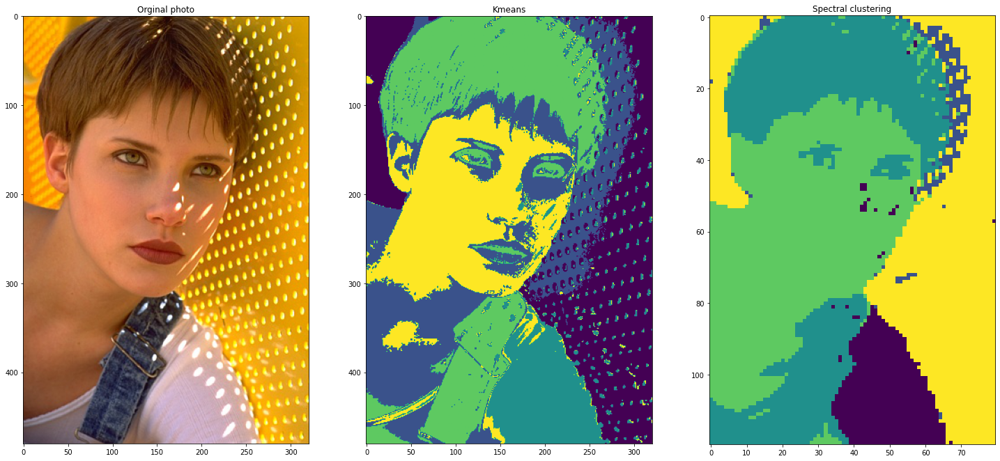

In [ ]:
n=51
k=5
# view_image_only(51)
img = apply_kmeans(n,k)
img2=apply_our_spectral(k,n)

fig = plt.figure(figsize=(25, 15))

fig.add_subplot(1, 3, 1)
plt.imshow(dataset[n])
plt.title("Orginal photo")
fig.add_subplot(1, 3, 2)
plt.imshow(img)
plt.title("Kmeans")
fig.add_subplot(1, 3, 3)
plt.imshow(img2)
plt.title("Spectral clustering")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


Text(0.5, 1.0, 'Spectral clustering')

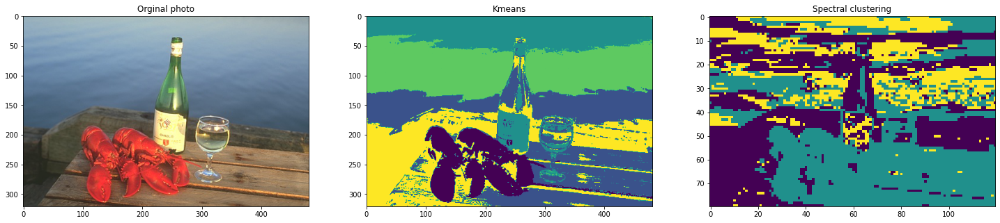

In [ ]:
n=72
k=5
# view_image_only(72)
img = apply_kmeans(n,k)
img2=apply_our_spectral(k,n)

fig = plt.figure(figsize=(25, 15))

fig.add_subplot(1, 3, 1)
plt.imshow(dataset[n])
plt.title("Orginal photo")
fig.add_subplot(1, 3, 2)
plt.imshow(img)
plt.title("Kmeans")
fig.add_subplot(1, 3, 3)
plt.imshow(img2)
plt.title("Spectral clustering")